<a href="https://colab.research.google.com/github/DavideMugi/ProgettoMachineLearning/blob/master/ACDavideSketch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/kamenbliznashki/sutton_barto

Cloning into 'sutton_barto'...
remote: Enumerating objects: 106, done.
remote: Total 106 (delta 0), reused 0 (delta 0), pack-reused 106
Receiving objects: 100% (106/106), 3.61 MiB | 29.36 MiB/s, done.
Resolving deltas: 100% (5/5), done.


In [ ]:
!pip install simglucose

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 119.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 157.8/157.8 kB 20.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.9/953.9 kB 77.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 55.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 101.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 17.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 110.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 120.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 117.4 MB/s eta 

Range of the CGM: [39.0, 600.0]
Basal range of the pump: [0.0, 30.0]
Bolus range of the pump: [0.0, 30.0]
Process ID: 1571
Simulation starts ...
Starting with:
BR=0.01, IC=0.01.

Reward at the end of the day 1: 0.182565951740871
State of the day 1: [0.22368404825912921, 0.91875, 0, 0]
Deterministic Action for the next day P_d_1=0.001118420241295647
Standard Deviation for the next day sigma_1=0.20543874543279317
Action for the next day u_1=0.1432070882282011
Entering the 2-th day with:
BR=0.01143207088228201, IC=0.01.
Effective Basal rate=0.01143207088228201

Reward at the end of the day 2: -0.36956261885591046
State of the day 2: [0.36956261885591046, 1.0, 0, 0]
480 0
State: [0.36956261885591046, 1.0, 0, 0]
Transformed feacture vector_2=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
Transformed feacture vector_1=[16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]
Value function V_1=0
Value function V_0=0
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
[16, 1

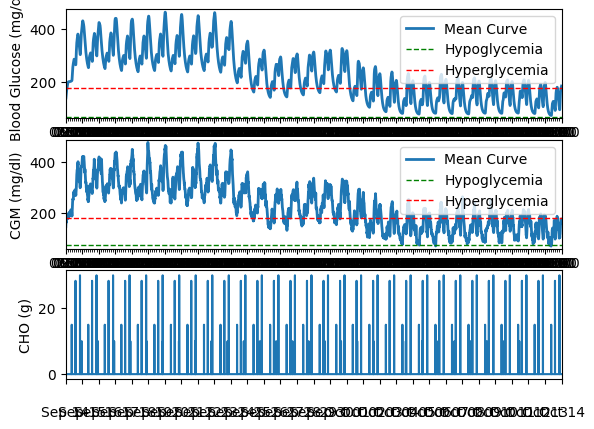

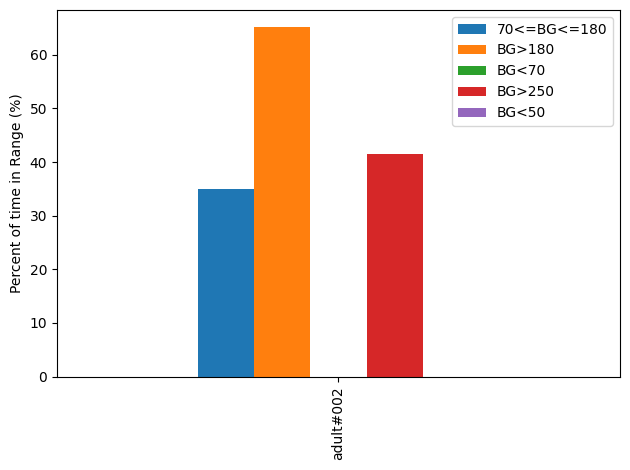

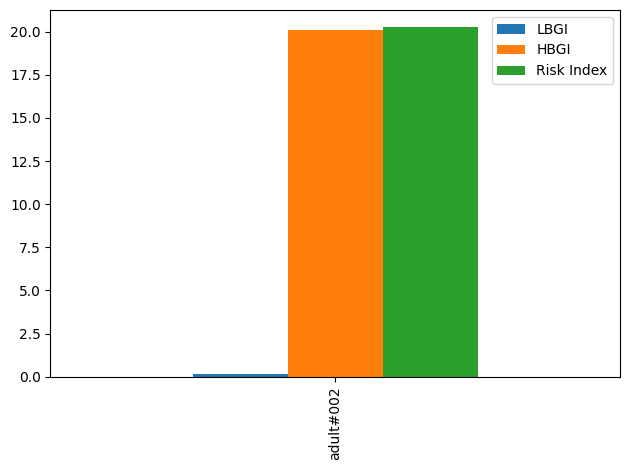

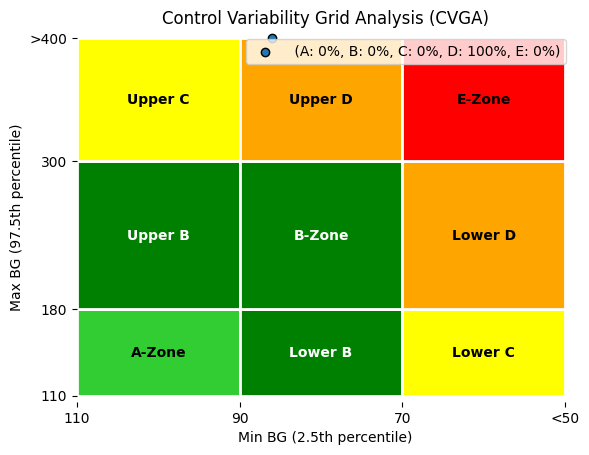

,70<=BG<=180,BG>180,BG<70,BG>250,BG<50,LBGI,HBGI,Risk Index
adult#002,34.92813,65.07187,0.0,41.497118,0.0,0.158762,20.087656,20.246418


In [ ]:
from simglucose.simulation.user_interface import simulate
from simglucose.controller.base import Controller, Action
from simglucose.simulation.scenario_gen import RandomScenario
from simglucose.simulation.scenario import CustomScenario
import numpy as np
import math
import itertools
from datetime import datetime, timedelta
from sutton_barto import tiles3


import pandas as pd
import pkg_resources

SENSOR_PARA_FILE = pkg_resources.resource_filename(
    'simglucose', 'params/sensor_params.csv')
PUMP_PARA_FILE = pkg_resources.resource_filename(
    'simglucose', 'params/pump_params.csv')

class MyController(Controller):
    def __init__(self, my_sim_timedelta, timedelta_window, h, KS, a_h, a_l, gamma, lamb, epsilon, my_sensor, my_pump):
        self.my_sensor=my_sensor
        self.my_pump=my_pump
        self.sensor_params = pd.read_csv(SENSOR_PARA_FILE)
        self.pump_params = pd.read_csv(PUMP_PARA_FILE)
        self.my_sim_timedelta=my_sim_timedelta
        self.my_sim_time = self.my_sim_timedelta.total_seconds() / 60 #obtaining  the number of minutes from the timedelta object specifying the simulation duration
        self.timedelta_window=timedelta_window
        self.time_window = self.timedelta_window.total_seconds() / 60
        self.windows=math.ceil(self.my_sim_time/self.time_window)
        self.k=4 #dimension of the state, fixed
        self.h_samples=[0]*(self.windows+1) #counts how many times in each time window the patient stays in the hyperglycemia zone
        self.l_samples=[0]*(self.windows+1) #counts how many times in each time window the patient stays in the hypoglycemia zone
        self.x=[[0]*self.k for _ in range(self.windows+1)] #this will be the state space, for each time window

        self.temp_1=[0]*(self.windows+1)
        self.temp_2=[0]*(self.windows+1)


        self.theta_BR=[[0]*self.k for _ in range(self.windows+1)]
        self.theta_IC=[[0]*self.k for _ in range(self.windows+1)]
        self.t=0

        self.average_cost_BR=[0]*(self.windows+1)
        self.average_cost_IC=[0]*(self.windows+1)
        self.average_reward_BR=[0]*(self.windows+1)
        self.average_reward_IC=[0]*(self.windows+1)

        self.delta_BR=[0]*(self.windows+1)
        self.delta_IC=[0]*(self.windows+1)



        #set of parameters I'll use later on
        self.h=h
        self.KS=KS
        self.a_h=a_h
        self.a_l=a_l
        self.gamma=gamma
        self.lamb=lamb
        self.epsilon=epsilon


        self.n=3 #you can play with this

        self.N=(self.n+1)**(self.k) #number of features


        self.tilings_number=16
        self.tiles_number_ax=10
        self.N = ((self.tiles_number_ax+1)**self.k)*self.tilings_number
        if self.tilings_number < 4*self.k and self.tilings_number%2 != 0:
         raise ValueError("The number of tilings needs to be a power of two and greater than four times the state space dimension.")
        #square tilings
        self.scaleFactor = self.tiles_number_ax/1 #1 is the width of a single dimension of the state space, and we assume it is a squared state space
        if self.N <= 2**13: #2^13 is 8192
          self.tiles_number = self.N
        else:
          self.tiles_number = 2**13
        self.iht=tiles3.IHT(self.tiles_number) #tiles number is a bit conservative here, possible to choose a smaller value

        self.alpha_feature = 0.1/self.tilings_number

        self.w_BR=[[0]*self.N for _ in range(self.windows+1)] #initialization
        self.w_IC=[[0]*self.N for _ in range(self.windows+1)] #initialization

        self.z_w_BR=[[0]*self.N for _ in range(self.windows+1)]
        self.z_w_IC=[[0]*self.N for _ in range(self.windows+1)]
        self.z_theta_BR=[[0]*self.k for _ in range(self.windows+1)]
        self.z_theta_IC=[[0]*self.k for _ in range(self.windows+1)]

        self.alpha_C=0.1
        self.alpha_R=2.5e-1
        self.alpha_theta=5e-2
        self.alpha_w=1e-1

        self.lambda_w=0.15 #0.1
        self.lambda_theta=0.1 #0.1 0.05


        self.BR=1e-2 #an optimal value to start for this patient seems: 2.5e-2 (no meals) common range 3.3e-3 3.3e-2
        self.IC=1e-2 #an optimal value to start for this patient seems: 4e-2 (but basal zero)

        self.rate_BR=[0]*(self.windows+1)
        self.rate_IC=[0]*(self.windows+1)

        self.u_BR=[0]*(self.windows+1)
        self.u_IC=[0]*(self.windows+1)
        self.P_d_BR=[0]*(self.windows+1)
        self.P_d_IC=[0]*(self.windows+1)
        self.sigma_BR=[self.epsilon**0.5]*(self.windows+1)
        self.sigma_IC=[self.epsilon**0.5]*(self.windows+1)




        #temp_list=[]
        #for j in range(self.n+1):
        #  temp_list.append(j)
        #self.c_list = list(itertools.product(temp_list, repeat=self.k))
        #print(self.c_list)

        #self.alpha_feature=[]
        #for j in range(len(self.c_list)):
        #  if self.dot_product(self.c_list[j], self.c_list[j])==0:
        #    self.alpha_feature.append(1)
        #  else:
        #    self.alpha_feature.append(1/(self.dot_product(self.c_list[j], self.c_list[j])))
        #self.alpha_feature = [entry**0.5 for entry in self.alpha_feature]
        #self.alpha_feature = [entry * (self.alpha_w) for entry in self.alpha_feature]





        for i in range(self.sensor_params.shape[0]):
          if self.sensor_params.loc[i, 'Name'] == self.my_sensor:
            row_label=i
        self.max_G=self.sensor_params.loc[row_label, 'max']
        self.min_G=self.sensor_params.loc[row_label, 'min']
        print(f"Range of the CGM: [{self.min_G}, {self.max_G}]")

        for i in range(self.pump_params.shape[0]):
          if self.pump_params.loc[i, 'Name'] == self.my_pump:
            row_label=i
        self.max_basal=self.pump_params.loc[row_label, 'max_basal']
        self.min_basal=self.pump_params.loc[row_label, 'min_basal']
        self.max_bolus=self.pump_params.loc[row_label, 'max_bolus']
        self.min_bolus=self.pump_params.loc[row_label, 'min_bolus']
        print(f"Basal range of the pump: [{self.min_basal}, {self.max_basal}]")
        print(f"Bolus range of the pump: [{self.min_bolus}, {self.max_bolus}]")


    def feature_transformation(self, x):
        scaled_x = [entry * self.scaleFactor for entry in x]
        x_indices_tiles = tiles3.tiles(self.iht, self.tilings_number, scaled_x)
        self.iht.fullp()
        return x_indices_tiles


    def saturate(self, value, x_min, x_max):
        if value < x_min:
          return x_min
        elif value > x_max:
          return x_max
        else:
          return value

    def dot_product(self, A, B):
        if len(A) != len(B):
          raise ValueError("Lists A and B must have the same length")
        result = 0
        for i in range(len(A)):
          result += A[i] * B[i]
        return result

    #def feature_transformation(self, x):
        #f=[]
        #for j in range(len(self.c_list)):
          #f.append(math.cos(math.pi*(self.dot_product(self.c_list[j], x))))
        #return f

    #def value_function(self, w, f):
        #v=0 #initialization
        #for j in range(self.N):
          #v += w[j]*f[j]
        #return v

    def value_function(self, f, w):
        v=0 #initialization
        for j in f:
          v += w[j]
        return v


    def deterministic_BR_control_action(self, x, theta):
        #linear deterministic control action
        P_a=self.dot_product(x, theta)
        #supervisory control action
        if (x[0]==0) and (x[2]==0):
          P_s=0
        if (x[0]>0) and (x[2]==0):
          P_s=0.1*x[0]
        if (x[2]>0):
          P_s=-0.1*x[2]
        #total deterministic control action
        P_d=self.h*P_a+(1-self.h)*P_s
        return P_d

    #def deterministic_BR_control_action(self, x, theta):
        ##linear deterministic control action
        #P_a=self.dot_product(x, theta)
        #P_d=P_a
        #return P_d



    def deterministic_IC_control_action(self, x, theta):
        #linear deterministic control action
        P_a=self.dot_product(x, theta)
        #supervisory control action
        if (x[0]==0) and (x[2]==0):
          P_s=0
        if (x[0]>0) and (x[2]==0):
          P_s=-0.1*x[1]
        if (x[2]>0):
          P_s=+0.1*x[2]
        #total deterministic control action
        P_d=self.h*P_a+(1-self.h)*P_s
        return P_d

    def exploratory_sigma(self, x):
        if self.KS*(x[1]**2+x[3]**2)>self.epsilon:
          sigma_square=self.KS*(x[1]**2+x[3]**2)
        else:
          sigma_square = self.epsilon
        sigma=sigma_square**0.5
        return sigma


    def policy_action(self, x, P_d):
        #self.dot_product(x, x)
        #just a way to ensure the parameter sigma is different from zero
        sigma=self.exploratory_sigma(x)
        #exploratory control action
        control_action = np.random.normal(P_d, sigma)
        return control_action, sigma

    def reward_function(self, x):
        #r=-(self.a_h/3*x[0]+self.a_h*x[1]+self.a_l/3*x[2]+self.a_l*x[3]) #it seems the best reward!
        #r=-(self.a_h*x[0]+self.a_l*x[2])/((self.a_h**2+self.a_l**2)**0.5)
        #r=-(self.a_h*x[0]+self.a_l*x[2])
        r=(1+4)*(1-x[1]-x[3])-(1*x[0]+4*x[2])
        #r=(1-x[1])+(1-x[2])
        #r=(1+x[1])**((-420/70)*x[0])+(1+x[3])**((-10/31)*x[2])
        return r

    def cost_function(self, x):
        c=(self.a_h*x[0]+self.a_h/2*x[1]+self.a_l*x[2]+self.a_l*x[3])
        return c

    #def TD_error(self, x, i, average_cost, w):
        #f1=self.feature_transformation(x[i])
        #f0=self.feature_transformation(x[i-1])

        #delta=self.cost_function(x[i])-average_cost[i-1]+self.value_function(f1, w[i-1])-self.value_function(f0, w[i-1])
        #return delta

    def TD_error(self, x, i, average_reward, w):
        f1=self.feature_transformation(x[i])
        print(f1)
        f0=self.feature_transformation(x[i-1])
        print(f0)

        delta=self.reward_function(x[i])-average_reward[i-1]+self.value_function(f1, w[i-1])-self.value_function(f0, w[i-1])
        return delta

    def average_cost_update(self, average_cost, i, delta):
        a=average_cost[i-1]+self.alpha_C*delta[i]
        return a

    def average_reward_update(self, average_reward, i, delta):
        a=average_reward[i-1]+self.alpha_R*delta[i]
        return a

    #def critic_ET_update(self, x, z_w, i):
        #temp=[entry * (self.lambda_w) for entry in z_w[i-1]]
        #z_w=[a + b for a, b in zip(temp, self.feature_transformation(x[i-1]))]
        #return z_w

    def critic_ET_update(self, x, z_w, i):
        x_indices_tiles = self.feature_transformation(x[i-1])
        c=self.iht.count()
        for j in range(c):
          z_w[i][j] = self.lambda_w*z_w[i-1][j]
        for indices in x_indices_tiles:
          z_w[i][indices] += 1

    def actor_ET_update(self, x, z_theta, i, P_d, sigma, u):
        psi=[]
        for j in range(self.k):
          psi.append(((u[i-1]-P_d[i-1])/(sigma[i-1])**2)*self.h*x[i-1][j])

        print(f"Policy Gradient Nabla: {psi}")

        temp=[entry * (self.lambda_theta) for entry in z_theta[i-1]]
        z_theta=[a + b for a, b in zip(temp, psi)]
        return z_theta

    #def critic_update(self, z_w, delta, w, i):
        #temp1=[x * y for x, y in zip(self.alpha_feature, z_w[i])]
        #temp2=[entry * (delta[i]) for entry in temp1]
        ##temp=[entry * (self.alpha_w*delta[i]) for entry in z_w[i]]
        ##w=[a + b for a, b in zip(w[i-1], temp)]
        #w=[a + b for a, b in zip(w[i-1], temp2)]
        #return w

    def critic_update(self, z_w, delta, w, i):
        c = self.iht.count()
        for j in range(c):
          w[i][j]=w[i-1][j]+self.alpha_feature*delta[i]*z_w[i][j]

    #def actor_update(self, z_theta, delta, theta, i):
        #temp=[entry * (self.alpha_theta*delta[i]) for entry in z_theta[i]]
        #theta=[a + b for a, b in zip(theta[i-1], temp)]
        #return theta

    def actor_update(self, z_theta, delta, theta, i, x):
        sigma=self.exploratory_sigma(x[i])
        #sigma=1
        temp=[entry * (self.alpha_theta*(sigma**2)*delta[i]) for entry in z_theta[i]]
        theta=[a + b for a, b in zip(theta[i-1], temp)]
        return theta



    def policy(self, observation, reward, done, **kwargs):

        sample_time = kwargs.get('sample_time')  # Returns None if key not present, it seems implicitly defined as 3 minutes, sample time of the sensor
         #(which is different from the one of the insulin pump)
        if sample_time is None:
          raise ValueError("The 'sample_time' keyword argument is required.")
        meal = kwargs.get('meal')
        if meal is None:
          raise ValueError("The 'meal' keyword argument is required.")


        if self.t == 0:
          print(f"Starting with:\nBR={self.BR}, IC={self.IC}.")

        G = observation.CGM
        self.t += sample_time

        i=math.ceil(self.t/self.time_window)
        open_loop_period=2

        G_h=180
        G_l=70

        if G > G_h:
            self.h_samples[i] += 1
            self.temp_1[i] += G-G_h

            self.x[i][0]=(self.temp_1[i]/(self.h_samples[i]*(self.max_G-G_h))) #normalized hyperglycemia error
            self.x[i][1]=self.h_samples[i]/(self.time_window/sample_time) #normalized time spent in hyperglycemia

        if G < G_l:
            self.l_samples[i] += 1
            self.temp_2[i] += G_l-G

            self.x[i][2]=(self.temp_2[i]/(self.l_samples[i]*(G_l-self.min_G))) #normalized hypoglycemia error
            self.x[i][3]=self.l_samples[i]/(self.time_window/sample_time) #normalized time spent in hypoglycemia

        if (self.t%self.time_window==0) and i==1:
          green_code="\033[32m"
          red_code = "\033[91m"  # ANSI escape code for red text
          reset_code = "\033[0m"   # ANSI escape code to reset color
          #print(f"\n{red_code}Cost at the end of the day {i}: {self.cost_function(self.x[i])}{reset_code}")
          print(f"\n{red_code}Reward at the end of the day {i}: {self.reward_function(self.x[i])}{reset_code}")
          print(f"{green_code}State of the day {i}: {self.x[i]}{reset_code}")
          self.P_d_BR[i]=self.deterministic_BR_control_action(self.x[i], self.theta_BR[i])
          self.P_d_IC[i]=self.deterministic_IC_control_action(self.x[i], self.theta_IC[i])
          #self.P_d_BR[i]=self.deterministic_BR_control_action_Sun(self.x_1[i], self.x_2[i], self.theta_BR[i])
          #self.P_d_IC[i]=self.deterministic_IC_control_action_Sun(self.x_1[i], self.x_2[i], self.theta_IC[i])
          print(f"Deterministic Action for the next day P_d_{i}={self.P_d_BR[i]}")
          [self.u_BR[i], self.sigma_BR[i]]=self.policy_action(self.x[i], self.P_d_BR[i])
          [self.u_IC[i], self.sigma_IC[i]]=self.policy_action(self.x[i], self.P_d_IC[i])
          print(f"Standard Deviation for the next day sigma_{i}={self.sigma_BR[i]}")

          print(f"Action for the next day u_{i}={self.u_BR[i]}")
          #self.rate_BR[i+1]=self.saturate(self.u_BR[i+1], -30/100, 30/100)
          #self.rate_IC[i+1]=self.saturate(self.u_IC[i+1], -(10/100+1), (10/100-1))
          #print(f"Saturated action for the next day u_{i+1}={self.rate_BR[i+1]}")



          #self.BR=self.BR+(self.rate_BR[i+1])*self.BR
          #self.IC=self.IC+(self.rate_IC[i+1])*self.IC

          self.BR=self.BR+(self.u_BR[i])*self.BR
          #self.IC=self.IC+(self.u_IC[i+1])*self.IC

          #self.BR=self.u_BR[i+1]
          #self.IC=self.u_IC[i+1]

          print(f"Entering the {i+1}-th day with:\nBR={self.BR}, IC={self.IC}.")
          print(f"Effective Basal rate={self.saturate(self.BR, self.min_basal, self.max_basal)}")


        if (self.t%self.time_window==0) and open_loop_period<= i <(self.windows):
          green_code="\033[32m"
          red_code = "\033[91m"  # ANSI escape code for red text
          reset_code = "\033[0m"   # ANSI escape code to reset color
          #print(f"\n{red_code}Cost at the end of the day {i}: {self.cost_function(self.x[i])}{reset_code}")
          print(f"\n{red_code}Reward at the end of the day {i}: {self.reward_function(self.x[i])}{reset_code}")
          print(f"{green_code}State of the day {i}: {self.x[i]}{reset_code}")
          print(self.h_samples[i], self.l_samples[i])
          print(f"State: {self.x[i]}")
          f1=self.feature_transformation(self.x[i])
          f0=self.feature_transformation(self.x[i-1])
          print(f"Transformed feacture vector_{i}={f1}")
          print(f"Transformed feacture vector_{i-1}={f0}")
          print(f"Value function V_1={self.value_function(f1, self.w_BR[i-1] )}")
          print(f"Value function V_0={self.value_function(f0, self.w_BR[i-1] )}")
          #self.delta_BR[i]=self.TD_error(self.x, i, self.average_cost_BR, self.w_BR)
          #self.delta_IC[i]=self.TD_error(self.x, i, self.average_cost_IC, self.w_IC)
          self.delta_BR[i]=self.TD_error(self.x, i, self.average_reward_BR, self.w_BR)
          self.delta_IC[i]=self.TD_error(self.x, i, self.average_reward_IC, self.w_IC)
          print(f"TD error d_{i}={self.delta_BR[i]}")


          #self.average_cost_BR[i]=self.average_cost_update(self.average_cost_BR, i, self.delta_BR)
          #self.average_cost_IC[i]=self.average_cost_update(self.average_cost_IC, i, self.delta_IC)

          self.average_reward_BR[i]=self.average_reward_update(self.average_reward_BR, i, self.delta_BR)
          self.average_reward_IC[i]=self.average_reward_update(self.average_reward_IC, i, self.delta_IC)
          print(f"Average reward R_{i}={self.average_reward_BR[i]}")

          #self.z_w_BR[i]=self.critic_ET_update(self.x, self.z_w_BR, i)
          #self.z_w_IC[i]=self.critic_ET_update(self.x, self.z_w_IC, i)
          self.critic_ET_update(self.x, self.z_w_BR, i)
          self.critic_ET_update(self.x, self.z_w_IC, i)
          print(f"Eligibility Trace z_w_{i}={self.z_w_BR[i]}")

          self.z_theta_BR[i]=self.actor_ET_update(self.x, self.z_theta_BR, i, self.P_d_BR, self.sigma_BR, self.u_BR)
          self.z_theta_IC[i]=self.actor_ET_update(self.x, self.z_theta_IC, i, self.P_d_IC, self.sigma_IC, self.u_IC)
          print(f"Eligibility Trace z_theta_{i}={self.z_theta_BR[i]}")

          #self.w_BR[i]=self.critic_update(self.z_w_BR, self.delta_BR, self.w_BR, i)
          #self.w_IC[i]=self.critic_update(self.z_w_IC, self.delta_IC, self.w_IC, i)
          self.critic_update(self.z_w_BR, self.delta_BR, self.w_BR, i)
          self.critic_update(self.z_w_IC, self.delta_IC, self.w_IC, i)
          #print(f"Critic Parameter w_{i}={self.w_BR[i]}")


          self.theta_BR[i]=self.actor_update(self.z_theta_BR, self.delta_BR, self.theta_BR, i, self.x)
          self.theta_IC[i]=self.actor_update(self.z_theta_BR, self.delta_BR, self.theta_BR, i, self.x)
          print(f"Actor parameter theta_{i}=({self.theta_BR[i]})\n")

          #I'm doing i+1-->i

          self.P_d_BR[i]=self.deterministic_BR_control_action(self.x[i], self.theta_BR[i])
          self.P_d_IC[i]=self.deterministic_IC_control_action(self.x[i], self.theta_IC[i])
          #self.P_d_BR[i]=self.deterministic_BR_control_action_Sun(self.x_1[i], self.x_2[i], self.theta_BR[i])
          #self.P_d_IC[i]=self.deterministic_IC_control_action_Sun(self.x_1[i], self.x_2[i], self.theta_IC[i])
          print(f"Deterministic Action for the next day P_d_{i+1}={self.P_d_BR[i]}")
          [self.u_BR[i], self.sigma_BR[i]]=self.policy_action(self.x[i], self.P_d_BR[i])
          [self.u_IC[i], self.sigma_IC[i]]=self.policy_action(self.x[i], self.P_d_IC[i])
          print(f"Standard Deviation for the next day sigma_{i}={self.sigma_BR[i]}")
          print(f"Action for the next day u_{i}={self.u_BR[i]}")

          #self.rate_BR[i+1]=self.saturate(self.u_BR[i+1], -30/100, 30/100)
          #self.rate_IC[i+1]=self.saturate(self.u_IC[i+1], -(10/100+1), (10/100-1))
          #print(f"Saturated action for the next day u_{i+1}={self.rate_BR[i+1]}")



          #self.BR=self.BR+(self.rate_BR[i+1])*self.BR
          #self.IC=self.IC+(self.rate_IC[i+1])*self.IC

          self.BR=self.BR+(self.u_BR[i])*self.BR
          self.IC=self.IC+(self.u_IC[i])*self.IC

          #self.BR=self.u_BR[i+1]
          #self.IC=self.u_IC[i+1]

          print(f"Entering the {i+1}-th day with:\nBR={self.BR}, IC={self.IC}.")
          print(f"Effective Basal rate={self.saturate(self.BR, self.min_basal, self.max_basal)}")



        if self.t == self.my_sim_time:
          print(self.x)


        if i < open_loop_period or (i == open_loop_period and self.t%self.time_window != 0):
          basal_rate=self.BR
          bolus_rate=(self.IC*meal)/sample_time
          action = Action(basal=basal_rate, bolus=bolus_rate)
          return action
        else:
          #action = Action(basal=basal_rate, bolus=bolus_rate)
          basal_rate=self.BR
          bolus_rate=(self.IC*meal)/sample_time
          action = Action(basal=basal_rate, bolus=bolus_rate) #if just one day I give max basal rate next days is going to be still in hypoglcymeia
          return action


    def reset(self):
        pass


# specify start_time as the beginning of today
now = datetime.now()
my_start_time = datetime.combine(now.date(), datetime.min.time())
my_sim_time=timedelta(days=30) #duration of the simulation, 5 days = 11 min 22 s of simulation
my_time_window = timedelta(days=1) #duration of the time window
my_sensor='Dexcom'
my_pump='Insulet'

my_controller = MyController(my_sim_time, my_time_window, 0.95, 5e-2, 1, 10, 0.9, 0.5, (5e-2)/100, my_sensor, my_pump) #KS 0.05
#my_scenario = RandomScenario(start_time=my_start_time, seed=1)


#meal scenario by Elena Daskalaki
#meal_scenario=[]
#for k in range(my_sim_time.days):
#   if 11+24*k < my_sim_time.total_seconds()/3600:
#      CHO = np.random.uniform(30, 60)
#      time = np.random.uniform(7+24*k, 11+24*k)
#      meal_scenario.append((time, CHO))
#   if 16+24*k < my_sim_time.total_seconds()/3600:
#      CHO = np.random.uniform(70, 100)
#      time=np.random.uniform(13+24*k, 16+24*k)
#      meal_scenario.append((time, CHO))
#   if 22+24*k < my_sim_time.total_seconds()/3600:
#      CHO = np.random.uniform(70, 110)
#      time = np.random.uniform(20+24*k, 22+24*k)
#      meal_scenario.append((time, CHO))
#   if 24+24*k < my_sim_time.total_seconds()/3600:
#      CHO = np.random.uniform(20, 40)
#      time = np.random.uniform(23+24*k, 24+24*k)
#      meal_scenario.append((time, CHO))

#deterministic meal scenario by me
meal_scenario=[]
for k in range(my_sim_time.days):
   if 11+24*k < my_sim_time.total_seconds()/3600:
      CHO = 45
      time = 9+24*k
      meal_scenario.append((time, CHO))
   if 16+24*k < my_sim_time.total_seconds()/3600:
      CHO = 85
      time=14.5+24*k
      meal_scenario.append((time, CHO))
   if 22+24*k < my_sim_time.total_seconds()/3600:
      CHO = 90
      time = 21+24*k
      meal_scenario.append((time, CHO))
   if 24+24*k < my_sim_time.total_seconds()/3600:
      CHO = 30
      time = 23.524*k
      meal_scenario.append((time, CHO))

my_scenario = CustomScenario(start_time=my_start_time, scenario=meal_scenario)


simulate(sim_time=my_sim_time,
         scenario=my_scenario,
         controller=my_controller,
         start_time=my_start_time,
         save_path='/content/results/my_results1',
         animate=False,
         parallel=False,
         patient_names=['adult#002'], #use comma if multiples
         cgm_name=my_sensor,
         cgm_seed=42,
         insulin_pump_name=my_pump)


#def simulate(sim_time=None,
#             scenario=None,
#             controller=None,
#             patient_names=[],
#             cgm_name=None,
#             cgm_seed=None,
#             insulin_pump_name=None,
#             start_time=None,
#             save_path=None,
#             animate=None,
#             parallel=None)


#def simulate(self):
#        self.controller.reset()
#        obs, reward, done, info = self.env.reset()
#        tic = time.time()
#        while self.env.time < self.env.scenario.start_time + self.sim_time:
#            if self.animate:
#                self.env.render()
#            action = self.controller.policy(obs, reward, done, **info)
#            obs, reward, done, info = self.env.step(action)
#        toc = time.time()
#        logger.info('Simulation took {} seconds.'.format(toc - tic))


#        return Step(
#            observation=obs,
#            reward=reward,
#            done=done,
#            sample_time=self.sample_time,
#            patient_name=self.patient.name,
#            meal=CHO,
#            patient_state=self.patient.state,
#            time=self.time,
#            bg=BG,
#            lbgi=LBGI,
#            hbgi=HBGI,
#            risk=risk,
#        )


#BR=0.02011319431560497, IC=0.019802114572903633.

In [ ]:
ciccio=[0.5]*(2)
print(ciccio)

pasticcio=[[0.5]*2]*(10+1)
print(pasticcio)
print(pasticcio[9][1])

[0.5, 0.5]
[[0.5, 0.5], [0.5, 0.5], [0.5, 0.5], [0.5, 0.5], [0.5, 0.5], [0.5, 0.5], [0.5, 0.5], [0.5, 0.5], [0.5, 0.5], [0.5, 0.5], [0.5, 0.5]]
0.5


In [ ]:
a=489
i=math.ceil(a/480)
print(i)
print(a%480)

2
9


In [ ]:
n=3 #(n+1^)^k
k=2 #number of states
temp_list=[]
for j in range(n+1):
  temp_list.append(j)
c_list = list(itertools.product(temp_list, repeat=k))
print(c_list)

alpha_w=1

def dot_product(A, B):
    if len(A) != len(B):
      raise ValueError("Lists A and B must have the same length")
    result = 0
    for i in range(len(A)):
      result += A[i] * B[i]
    return result


alpha_feature=[]
for j in range(len(c_list)):
  if dot_product(c_list[j], c_list[j])==0:
    alpha_feature.append(1)
  else:
    alpha_feature.append(1/(dot_product(c_list[j], c_list[j])))
alpha_feature = [entry**0.5 for entry in alpha_feature]
alpha_feature = [entry * (alpha_w) for entry in alpha_feature]
print(alpha_feature)

[(0, 0), (0, 1), (0, 2), (0, 3), (1, 0), (1, 1), (1, 2), (1, 3), (2, 0), (2, 1), (2, 2), (2, 3), (3, 0), (3, 1), (3, 2), (3, 3)]
[1.0, 1.0, 0.5, 0.3333333333333333, 1.0, 0.7071067811865476, 0.4472135954999579, 0.31622776601683794, 0.5, 0.4472135954999579, 0.3535533905932738, 0.2773500981126146, 0.3333333333333333, 0.31622776601683794, 0.2773500981126146, 0.23570226039551584]


In [ ]:
class Ciccio():
    def _init_(self):
        self.tilings_number = 32
        #square tilings
        self.tiles_number_ax = 10
        self.scaleFactor = self.tiles_number_ax/1 #1 is the width of a single dimension of the state space, and we assume it is a squared state space
        self.tiles_number = ((self.tiles_number_ax+1)**self.k)*self.tilings_number
        self.iht = tiles3.IHT(self.tiles_number) #tiles number is a bit conservative here, possible to choose a smaller value

    def progress(self, x):
      x



    def tiles(self, x):
        scaled_x = [entry * self.scaleFactor for entry in x]
        for j in range(len(scaled_x)):
          x_indices_tiles = tiles3.tiles(self.iht, self.tilings_number, scaled_x[j])
        for j in range(len(x_indices_tiles)):
          f=[0]*len(self.tiles_number)
          f[x_indices_tiles[j]] = 1
        return f, x_indices_tiles

we=Ciccio()
we.tiles()

[0, 1, 2, 3, 4, 5, 6, 7]
[0, 1, 8, 9, 4, 5, 6, 7]


In [ ]:
# Create a list and a reference to it
list_a = [1, 2, 3]
list_b = list_a  # Both list_a and list_b reference the same list

# Modify list_a
list_a.append(4)

# Print both lists
print("list_a:", list_a)
print("list_b:", list_b)

list_a: [1, 2, 3, 4]
list_b: [1, 2, 3, 4]


In [ ]:
import numpy as np

C2=1.9

def f(x):
    if (x[0]**2 + x[1]**2)**0.5 > C2:
        return C2 / ((x[0]**2 + x[1]**2)**0.5)
    else:
        return 1

def absolute_value(x):
    return (x[0]**2 + x[1]**2)**0.5

def check_inequality(x, y):
    left_side = abs(f(x) - f(y))
    z = [a - b for a, b in zip(x, y)]
    right_side = C2 * absolute_value(z) / (1 + absolute_value(x) + absolute_value(y))
    return left_side <= right_side

# Generate random values of x and y for testing
num_samples = 5000000  # You can adjust the number of samples as needed
x_values = np.random.uniform(-40, 40, (num_samples, 2))  # Random 2D vectors between -200 and 200
y_values = np.random.uniform(-40, 40, (num_samples, 2))  # Random 2D vectors between -200 and 200

# Check the inequality for each pair of x and y
all_true = all(check_inequality(x, y) for x, y in zip(x_values, y_values))

if all_true:
    print("The inequality is true for all tested values of x and y.")
else:
    print("The inequality is not true for some tested values of x and y.")


The inequality is true for all tested values of x and y.


In [ ]:
#Actor–Critic with Eligibility Traces

In [ ]:
from pandas.core.series import validate_ascending
K=3 #n of page 234
#n=2 dimension of the state , (K+1)^n=(2+1)^2=9 number of features
temp_list=[]
for j in range(K+1):
  temp_list.append(j)

import itertools
c_list = list(itertools.product(temp_list, repeat=2))
print(c_list)

f=[]
import math

for j in range(len(c_list)):
  f.append(math.cos(math.pi*(1*c_list[j][0]+1*c_list[j][1])))
  #f.append(math.cos(math.pi*(x[i]*c_list[j][0]+x[i]*c_list[j][1])))

w=[0]*(len(c_list)) #initialization
v=0 #initialization

for j in range(len(c_list)):
  v += w[j]*f[j]

print(f)

alpha_h=1
alpha_l=10
#cost=alpha_h*x_1[i]+alpha_l*x_2[i]

import itertools
import math

self.n=2 #you can play with this
self.k=2 #dimension of the state, fixed
self.N=(n+1)^k #number of features
self.w=[0]*(self.N) #initialization



[(0, 0), (0, 1), (0, 2), (0, 3), (1, 0), (1, 1), (1, 2), (1, 3), (2, 0), (2, 1), (2, 2), (2, 3), (3, 0), (3, 1), (3, 2), (3, 3)]
[1.0, -1.0, 1.0, -1.0, -1.0, 1.0, -1.0, 1.0, 1.0, -1.0, 1.0, -1.0, -1.0, 1.0, -1.0, 1.0]


2